In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env genesys on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
#dataset = Root_Dataset(data['X_test'], data['y_test'])
#loader = DataLoader(dataset,
#                         batch_size = batch_size,
#                         shuffle = True, drop_last=True)

X_all = np.vstack((data['X_train'],data['X_val'],data['X_test']))
y_all = pd.concat((data['y_train'],data['y_val'],data['y_test']))
dataset = Root_Dataset(X_all, y_all)
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [6]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

## Extract a sample

In [7]:
sample = next(iter(loader))
xo = sample['x'].to(device)
y = sample['y'].to(device)
y_label = [num2class[i] for i in y.tolist()]

In [8]:
xo.shape

torch.Size([2000, 11, 17513])

In [9]:
len(y_label)

2000

In [10]:
len(loader)

55

In [11]:
## GRN for the transition t5 to t7
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            #pred_h = model.init_hidden(batch_size)
            #tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            #cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            cfrom = x[np.where(np.array(y_label)==ct)[0],5,:] 
            
            #pred_h = model.init_hidden(batch_size)
            #tto = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()   
            #cto = tto[np.where(np.array(y_label)==ct)[0],:]
            cto = x[np.where(np.array(y_label)==ct)[0],7,:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast


/tmp/ipykernel_919714/1864579634.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()


Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [12]:
# Save the array to disk
np.save('genesys_raw_ctw_t5-t7.npy', ctw)

In [11]:
ctw = np.load('genesys_raw_ctw_t5-t7.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    if np.std(ctw[i])==0:
        ctw_z[i] = np.zeros((17513, 17513))
    else:
        ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network Analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [18]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

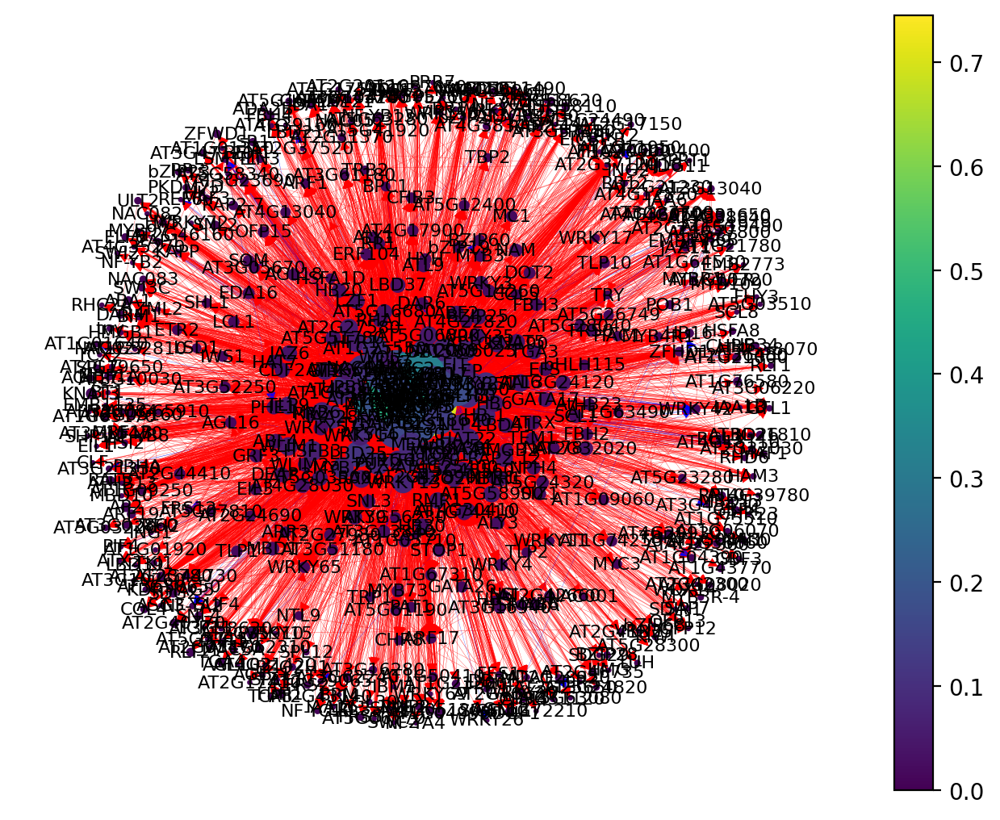

In [19]:
atri = network(0)

In [20]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
ARR5,0.499062,0.450281,0.048780,0.923193,0.000305,0.135721
WRKY13,0.110694,0.073171,0.037523,0.913601,0.000223,0.041895
GL2,0.444653,0.181989,0.262664,0.904058,0.000331,0.110958
PHE1,0.082552,0.028143,0.054409,0.881664,0.000203,0.035780
LSMT-L,0.024390,0.005629,0.018762,0.877841,0.000202,0.014887
...,...,...,...,...,...,...
RR12,0.031895,0.003752,0.028143,0.000000,0.000212,0.021155
HMGB1,0.020638,0.001876,0.018762,0.000000,0.000201,0.012669
BEH1,0.016886,0.000000,0.016886,0.000000,0.000210,0.010162
SDG2,0.035647,0.009381,0.026266,0.000000,0.000231,0.023970


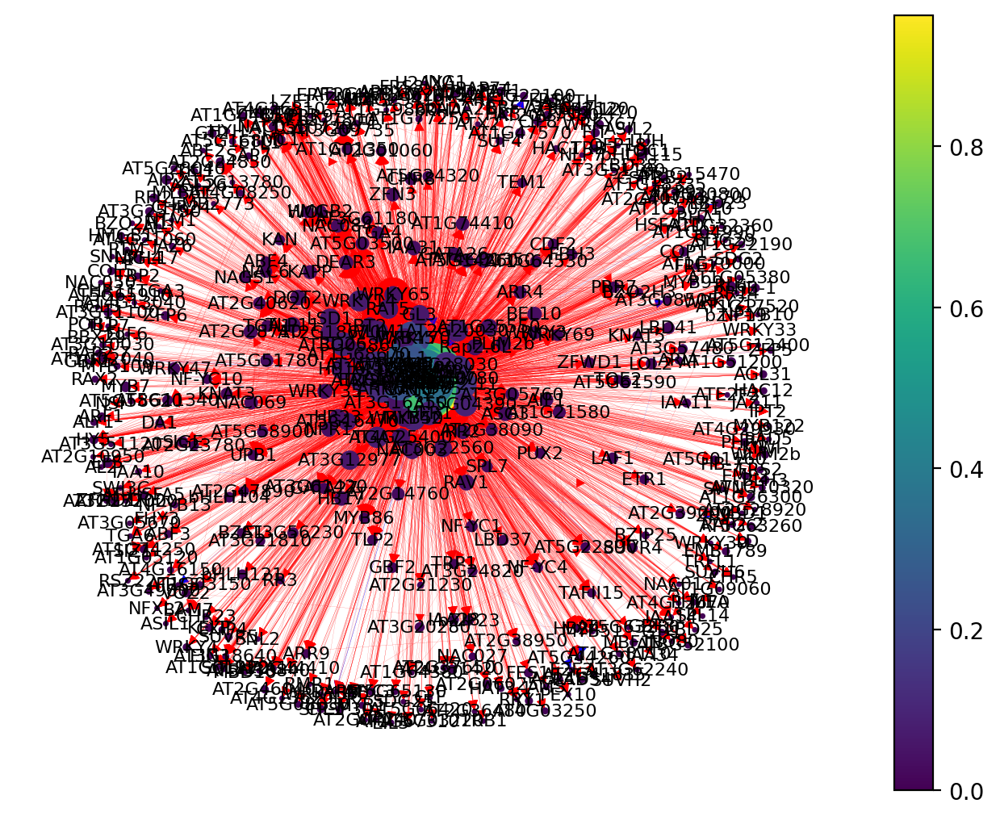

In [21]:
tri = network(1)

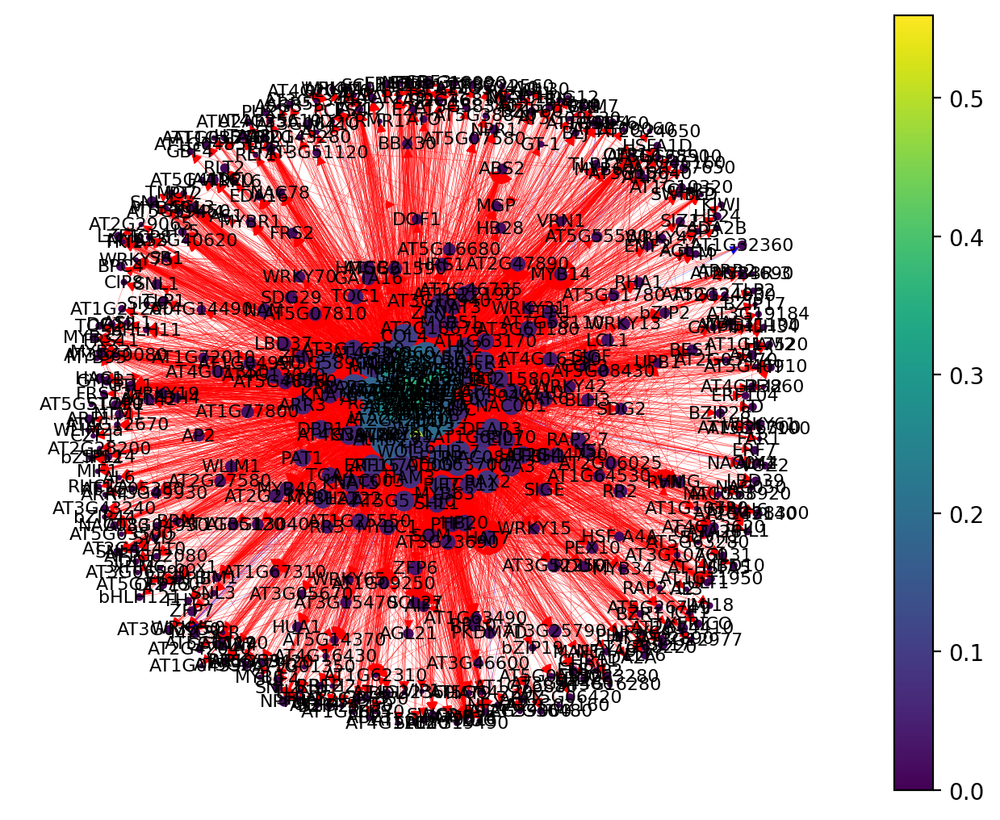

In [22]:
cor = network(2)

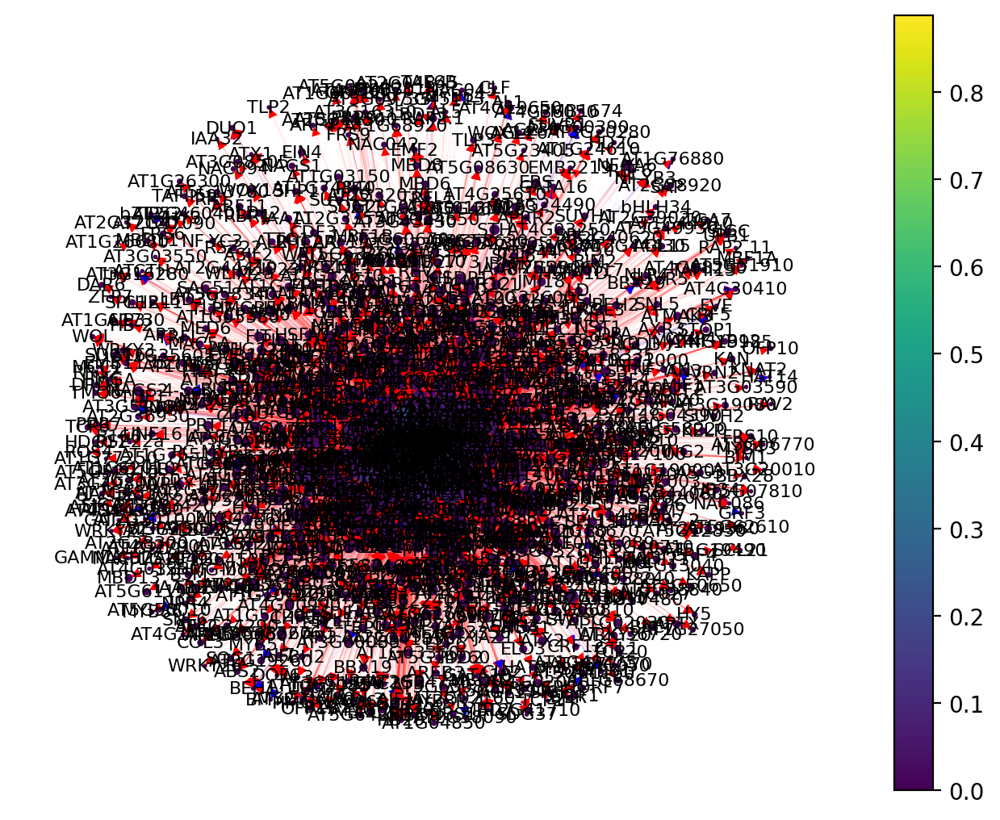

In [23]:
end = network(3)

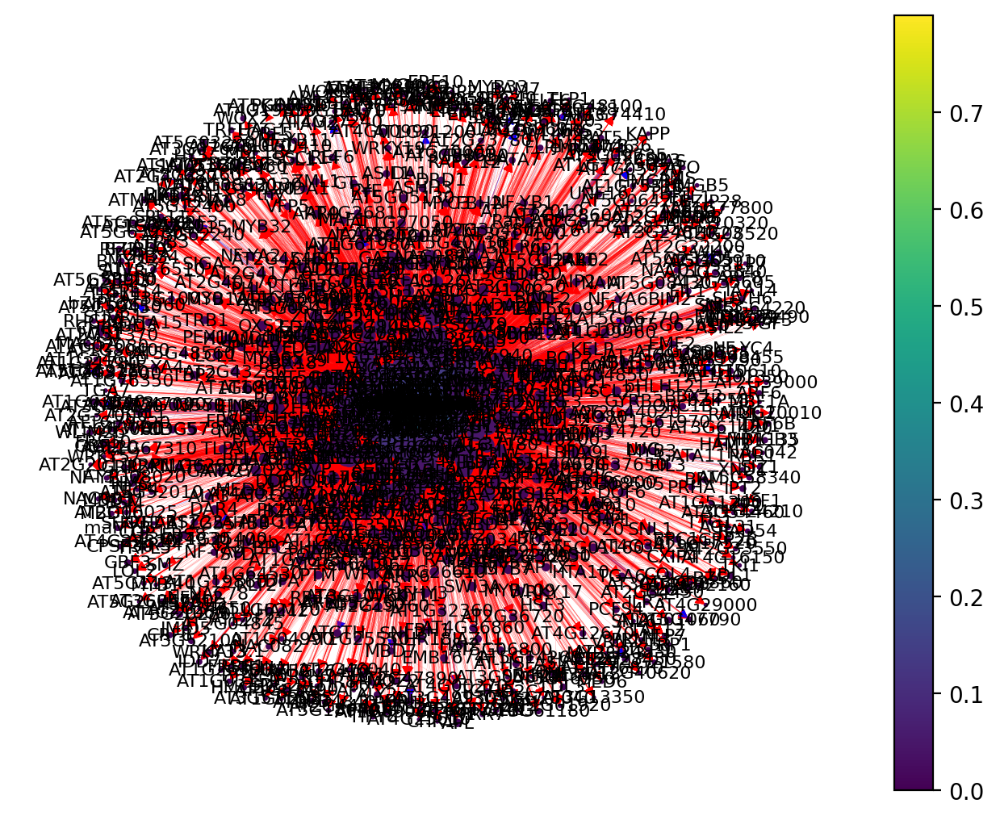

In [24]:
per = network(4)

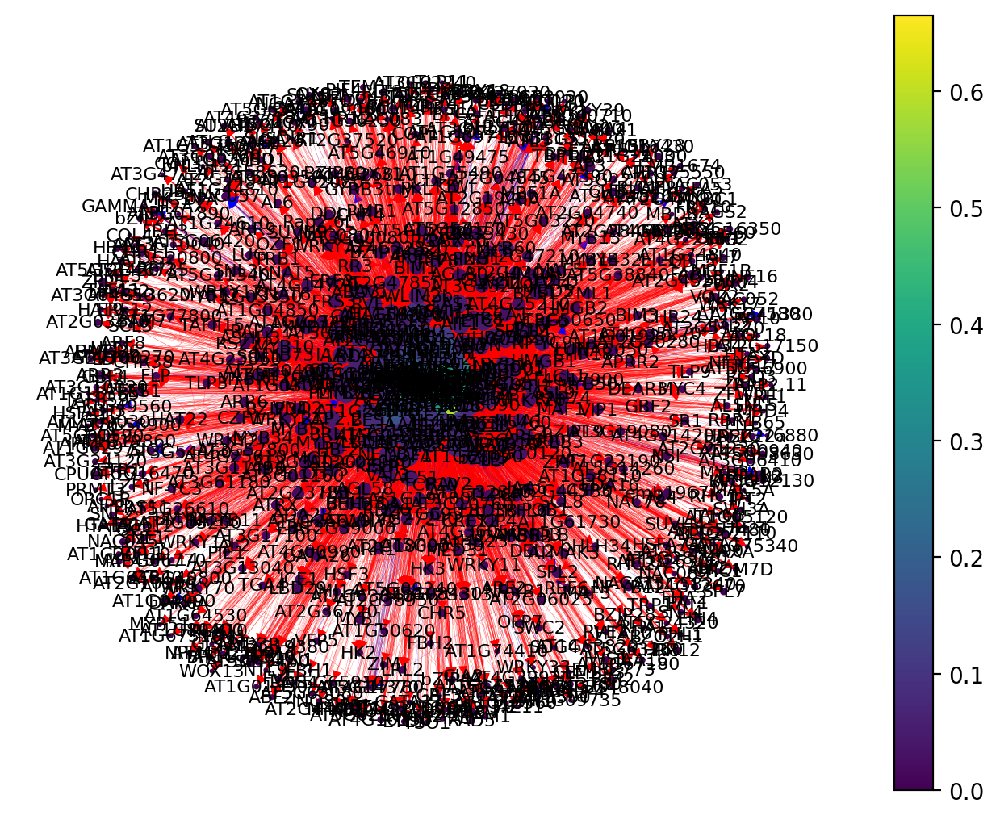

In [25]:
pro = network(5)

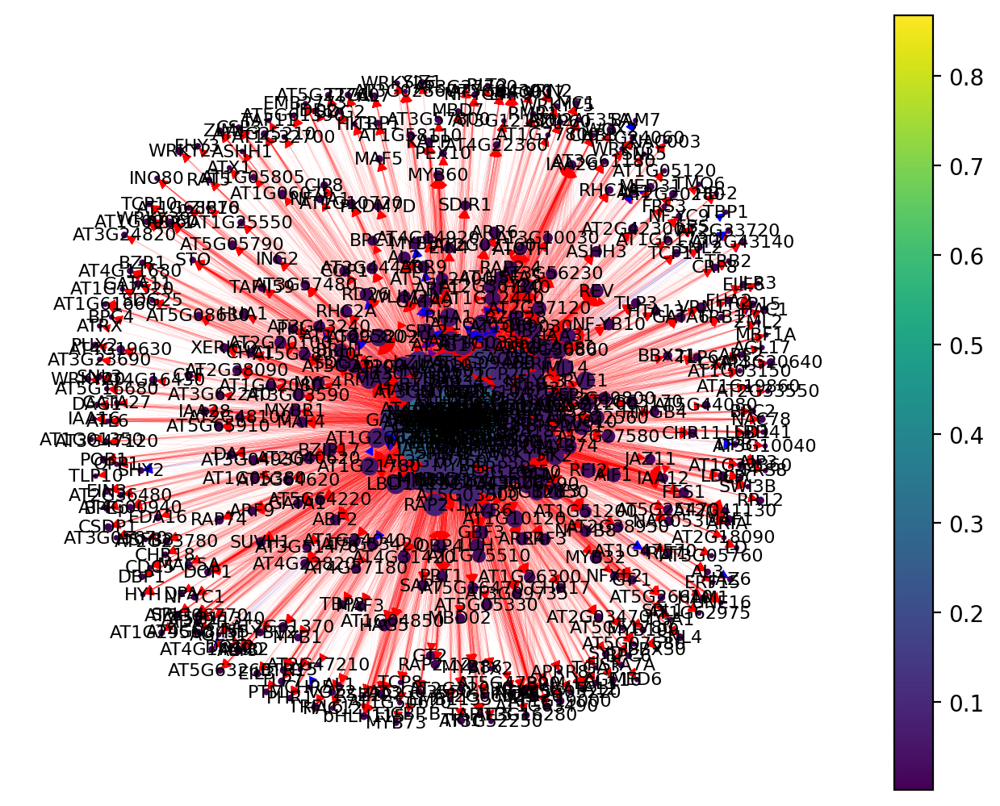

In [26]:
xyl = network(6)

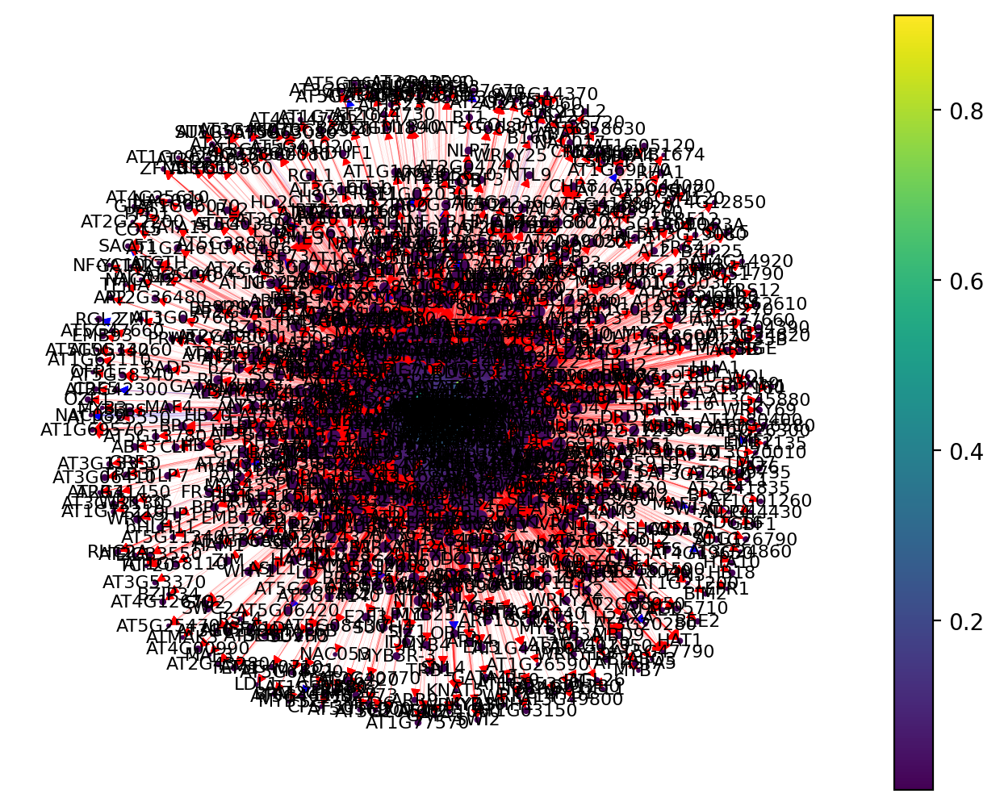

In [27]:
phl = network(7)

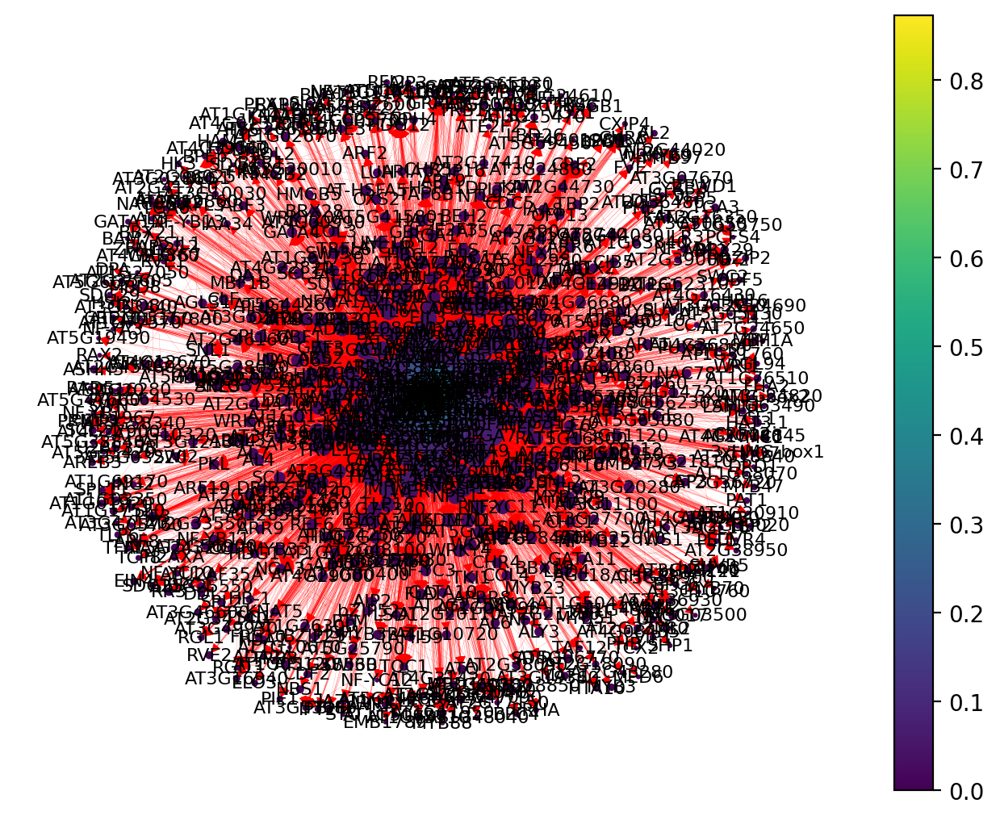

In [28]:
lrc = network(8)

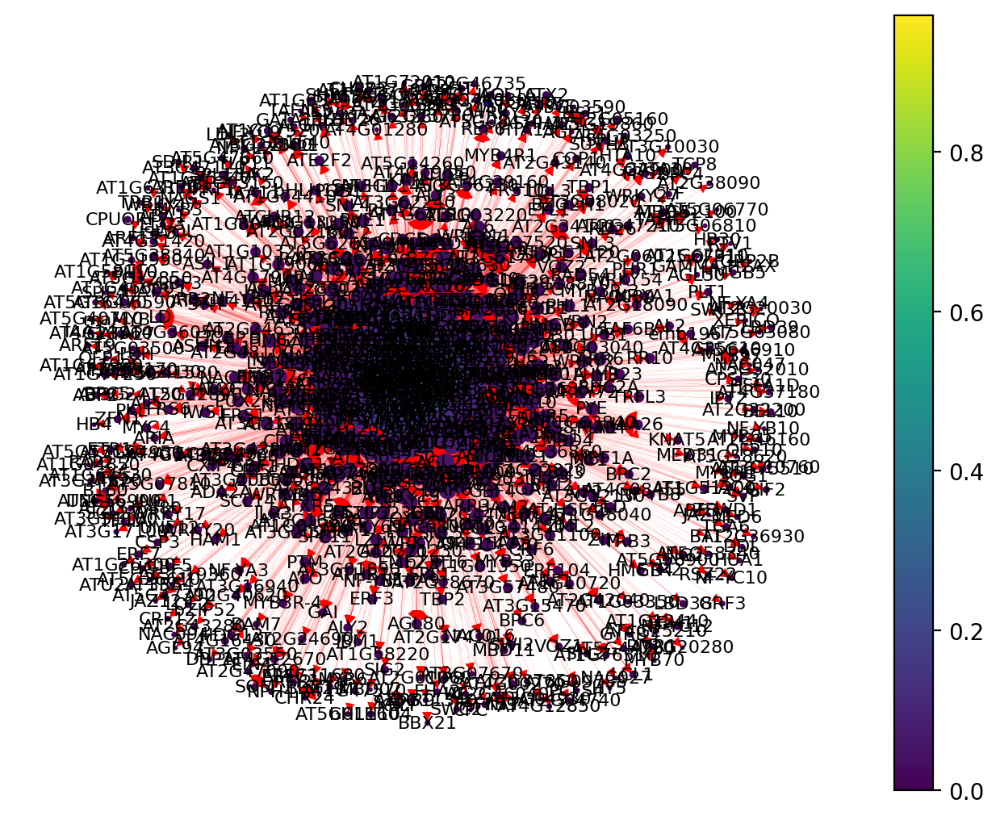

In [29]:
col = network(9)

In [30]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [31]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [32]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum


In [33]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
AT2G28710,0.275685,0.000044,0.469043,0.027972,0.232645,0.020979,6,7.026368
WRKY61,0.020229,0.023228,0.356473,0.400932,0.088180,0.109557,6,6.998600
HB17,0.529398,0.000011,0.215760,0.030303,0.095685,0.006993,6,6.878150
AT3G05860,0.057065,0.000060,0.208255,0.020979,0.258912,0.011655,6,6.556925
HB24,0.021784,0.000054,0.322702,0.006993,0.110694,0.060606,6,6.522833
AT5G06800,0.000071,0.002974,0.050657,0.258741,0.016886,0.076923,6,6.406251
RFI2,0.003110,0.000027,0.001876,0.009324,0.026266,0.018648,6,6.059252


In [34]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
WRKY13,0.913601,0.073171,0.037523,3,4.024295
GL2,0.904058,0.181989,0.262664,3,4.348711
PHE1,0.881664,0.028143,0.054409,3,3.964215
LSMT-L,0.877841,0.005629,0.018762,3,3.902231
AT4G31650,0.773269,0.007505,0.106942,3,3.887715
AT3G13840,0.388579,0.022514,0.026266,3,3.437360
MC2,0.192276,0.183865,0.039400,3,3.415540
MEA,0.123930,0.103189,0.204503,3,3.431622
AT4G18110,0.020987,0.001876,0.037523,3,3.060387
TTG2,0.020158,0.088180,0.225141,3,3.333479


In [35]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
LRL3,0.788015,0.962704,0.498834,3,5.249553
DAR5,0.623952,0.002331,0.020979,3,3.647262
RSL4,0.584913,0.554779,0.261072,3,4.400764
FRS5,0.327724,0.002331,0.002331,3,3.332386
AT4G09100,0.249815,0.673660,0.272727,3,4.196202
AT2G20030,0.242729,0.076923,0.006993,3,3.326645
RSL2,0.208037,0.682984,0.060606,3,3.951626
AT3G53370,0.106905,0.400932,0.331002,3,3.838840
AT2G24830,0.089569,0.009324,0.041958,3,3.140851
RHD6,0.084281,0.643357,0.372960,3,4.100598


In [36]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
GATA2,0.268995,0.496689,0.290066,3,4.055750
HB4,0.024328,0.037086,0.027815,3,3.089228
GATA11,0.018928,0.010596,0.027815,3,3.057338
AT1G74840,0.008304,0.161589,0.181457,3,3.351350
OFP6,0.005396,0.336424,0.019868,3,3.361688
...,...,...,...,...,...
AT3G24820,0.000005,0.003974,0.005298,3,3.009277
AGL94,0.000005,0.002649,0.025166,3,3.027820
AT4G00270,0.000004,0.005298,0.018543,3,3.023845
AT2G18850,0.000004,0.002649,0.019868,3,3.022520


In [37]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
SMZ,0.151406,0.139208,0.029374,3,3.319989
IAA20,0.058495,0.048531,0.208174,3,3.315200
HSFA8,0.052913,0.025543,0.074074,3,3.152530
CHR24,0.000970,0.002554,0.049808,3,3.053333
AT1G50410,0.000746,0.061303,0.029374,3,3.091423
SNI1,0.000477,0.169860,0.035760,3,3.206096
FRS8,0.000418,0.033206,0.030651,3,3.064275
AT1G03150,0.000367,0.002554,0.011494,3,3.014416
NF-YC1,0.000349,0.028097,0.007663,3,3.036109
AT3G13350,0.000314,0.017880,0.006386,3,3.024579


In [38]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
AT1G05710,0.127350,0.410901,0.541414,0.400197,0.197980,0.064897,6,7.742739
RAX2,0.002441,0.647675,0.084848,0.314651,0.078788,0.429695,6,7.558098
BLJ,0.000008,0.886681,0.006061,0.341200,0.018182,0.295969,6,7.548100
MYB12,0.130606,0.111314,0.206061,0.006883,0.779798,0.296952,6,7.531613
AGL42,0.000266,0.911574,0.018182,0.203540,0.066667,0.077679,6,7.277908
ERF15,0.000286,0.943206,0.078788,0.033432,0.052525,0.046214,6,7.154451
JKD,0.070421,0.002084,0.139394,0.127827,0.442424,0.246804,6,7.028954
AT3G24120,0.013839,0.230192,0.254545,0.156342,0.139394,0.191740,6,6.986053
IDD4,0.001333,0.421370,0.195960,0.084562,0.040404,0.037365,6,6.780994
OFP12,0.000008,0.497908,0.002020,0.001967,0.173737,0.027532,6,6.703172


In [39]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT2G38300,0.481495,0.404040,0.442424,3,4.327960
AT2G42660,0.098520,0.191919,0.224242,3,3.514681
AT1G72210,0.059948,0.349495,0.329293,3,3.738736
LRP1,0.012035,0.111111,0.230303,3,3.353449
SIGF,0.008719,0.022222,0.014141,3,3.045082
ESE3,0.005140,0.006061,0.054545,3,3.065747
AT4G20970,0.003165,0.002020,0.016162,3,3.021347
WRKY50,0.002331,0.002020,0.034343,3,3.038695
NAC044,0.002135,0.006061,0.004040,3,3.012236
EPR1,0.001276,0.012121,0.042424,3,3.055821


In [40]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
MYB68,9.802124e-01,0.590954,0.237955,3,4.809121
chr31,9.444067e-01,0.271386,0.271386,3,4.487180
EBS,8.767614e-01,0.007866,0.022616,3,3.907243
AT1G14600,8.295270e-01,0.011799,0.022616,3,3.863942
BIB,8.205952e-01,0.092429,0.062930,3,3.975954
TIFY8,8.073818e-01,0.016716,0.011799,3,3.835897
AT1G24210,7.641783e-01,0.016716,0.012783,3,3.793677
MYB122,5.774007e-01,0.314651,0.046214,3,3.938266
ULT2,5.239966e-01,0.094395,0.036382,3,3.654773
AT3G10040,4.760963e-01,0.027532,0.009833,3,3.513461


In [41]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
ATAUX2-11,0.248159,0.544157,0.674719,0.059681,0.018519,0.591656,0.630435,0.013304,0.010893,0.312263,0.183794,0.017738,12,15.305318
AT1G69580,0.010278,0.734781,0.029629,0.982333,0.090414,0.093552,0.021739,0.322616,0.077342,0.118837,0.029644,0.186253,12,14.697418
AT1G61660,0.141926,0.444208,0.231558,0.031112,0.065359,0.214918,0.001976,0.203991,0.040305,0.413401,0.049407,0.114191,12,13.952352
IAA13,0.024999,0.142825,0.003299,0.030958,0.041394,0.328698,0.124506,0.257206,0.087146,0.270544,0.213439,0.135255,12,13.660269
AT3G20640,0.012619,0.008104,0.001792,0.950984,0.040305,0.080910,0.007905,0.064302,0.051198,0.070796,0.019763,0.090909,12,13.399589
ARF9,0.011501,0.008640,0.000106,0.000070,0.044662,0.036662,0.009881,0.036585,0.004357,0.087231,0.069170,0.035477,12,12.344344


In [42]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
GATA23,0.981663,0.023965,0.055556,3,4.061184
bZIP4,0.972654,0.214597,0.018519,3,4.205770
FRS11,0.940028,0.005447,0.022876,3,3.968350
AT1G26790,0.924041,0.208061,0.014161,3,4.146263
GAMMA-H2AX,0.920123,0.020697,0.041394,3,3.982214
AT1G27050,0.392489,0.007625,0.018519,3,3.418633
AT4G00238,0.251481,0.002179,0.001089,3,3.254749
WHY3,0.220835,0.005447,0.005447,3,3.231728
AT1G61960,0.219207,0.001089,0.004357,3,3.224654
BSM,0.202307,0.003268,0.013072,3,3.218647


In [43]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
MYB10,0.979873,0.032870,0.059418,3,4.072162
IAA12,0.976809,0.664981,0.309735,3,4.951524
HAT3,0.858265,0.127686,0.026549,3,4.012500
BZIP24,0.820888,0.021492,0.003793,3,3.846173
HSFB4,0.812082,0.063211,0.032870,3,3.908163
ZFP7,0.786570,0.016435,0.029077,3,3.832082
MYB60,0.765826,0.036662,0.042984,3,3.845472
HB18,0.212028,0.108723,0.102402,3,3.423153
AT1G76870,0.139194,0.006321,0.002528,3,3.148044
BBX30,0.043848,0.021492,0.026549,3,3.091888


In [44]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
VND1,0.990756,0.373518,0.106719,3,4.470994
HB31,0.990087,0.363636,0.116601,3,4.470324
MYB83,0.989324,0.749012,0.160079,3,4.898415
VND6,0.972661,0.322134,0.059289,3,4.354084
AT1G68200,0.968837,0.505929,0.077075,3,4.551841
AT4G16610,0.961018,0.239130,0.110672,3,4.310821
AT1G66810,0.930619,0.666008,0.084980,3,4.681607
AT4G14490,0.914801,0.003953,0.027668,3,3.946421
VND7,0.706997,0.764822,0.173913,3,4.645732
MYB99,0.416609,0.260870,0.073123,3,3.750601


In [45]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
AT2G03500,0.884306,0.620843,0.506652,3,5.011800
ARF18,0.830031,0.038803,0.003326,3,3.872160
GATA20,0.589867,0.206208,0.076497,3,3.872572
BHLH101,0.443258,0.043237,0.008869,3,3.495365
AT3G12730,0.109359,0.741685,0.474501,3,4.325545
AT3G46070,0.032355,0.002217,0.016630,3,3.051202
AT5G52010,0.007051,0.014412,0.093126,3,3.114589
CRF1,0.003602,0.084257,0.156319,3,3.244178
ZAP1,0.002910,0.076497,0.070953,3,3.150360
BPC4,0.001725,0.014412,0.019956,3,3.036093


In [46]:
tf_spec.to_csv('scRNAseq_TF_GRN_centrality_t5-t7_zscore3.csv', index=True)

In [47]:
tf_spec

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
RD26,8.0,0.425891,0.365854,0.060038,0.140364,0.000295,0.118146,0.135198,0.093240,0.041958,...,0.055432,0.000028,0.000325,0.051446,0.016603,0.011494,0.005109,0.000036,0.000217,0.008457
IAA28,8.0,0.103189,0.084428,0.018762,0.002257,0.000229,0.046224,0.023310,0.011655,0.011655,...,0.145233,0.005191,0.000408,0.083308,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RAV1,7.0,0.155722,0.140713,0.015009,0.000000,0.000234,0.063013,0.067599,0.037296,0.030303,...,0.043237,0.000006,0.000338,0.038996,0.172414,0.085568,0.086845,0.000939,0.000302,0.050019
AT5G51780,7.0,0.037523,0.035647,0.001876,0.003393,0.000217,0.019195,0.034965,0.023310,0.011655,...,0.074279,0.005337,0.000347,0.042469,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ARR6,7.0,0.523452,0.499062,0.024390,0.642413,0.000317,0.134664,0.153846,0.118881,0.034965,...,0.057650,0.003210,0.000343,0.033548,0.033206,0.024266,0.008940,0.000461,0.000184,0.014827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ABAP1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.005543,0.000000,0.000203,0.003816,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AT4G31060,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.011086,0.000000,0.000229,0.007358,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TCP24,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.004435,0.000000,0.000195,0.007298,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PPD1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.011086,0.000000,0.000250,0.008328,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
